In [47]:
%matplotlib widget

import os
import tqdm
import h5py
import numpy as np
import pandas as pd
import pyarrow.parquet as pq
import matplotlib.pyplot as plt

from pyarrow.parquet import ParquetFile
from mne.io import concatenate_raws, read_raw_edf

from bscarlos.settings import OUTPUT_FOLDER
from bscarlos.settings import PROCESSED_KISPI_DATA_FOLDER
from bscarlos.detector_v3 import ClusteringDetector_v3
from bscarlos.data_processor_kispi import PatientDataProcessor

# KISPI (a1) Validation

This notebook runs the BSUPP algorithm on all KISPI patient data that was annotated and 'ground truth' labels by annotator1.

This assess how well the algorithm generalizes to new and 'unseen' KISPI pediatric EEG data.

Outputs in the form of metric scores (Sensitivity, Specificity, F1-scores, AUROC-scores/plots, NPV and MAE_bpm) from this notebook will be analyzed.

We will compare to USZ adult EEG data.

Additionally we will assess Cohen's Kappa to measure the interrater agreement three ways:
- annotator1 v. annotator2
- annotator1 v. BSUPP
- annotator2 v. BSUPP

In [2]:
data_files = sorted(list(PROCESSED_KISPI_DATA_FOLDER.glob('*a1_merged.parquet')))
data_attributes = pd.read_csv(PROCESSED_KISPI_DATA_FOLDER / 'data_attributes_kispi.csv').set_index("unique_patient_id")

In [3]:
data_files

[WindowsPath('C:/Users/c_arz/Documents/KISPI/Burst_Suppression_Project/Thesis/UnsuperDL-EEG-BSUPP/data/processed_kispi/SE008_a1_merged.parquet'),
 WindowsPath('C:/Users/c_arz/Documents/KISPI/Burst_Suppression_Project/Thesis/UnsuperDL-EEG-BSUPP/data/processed_kispi/SE021_a1_merged.parquet'),
 WindowsPath('C:/Users/c_arz/Documents/KISPI/Burst_Suppression_Project/Thesis/UnsuperDL-EEG-BSUPP/data/processed_kispi/SE026_a1_merged.parquet'),
 WindowsPath('C:/Users/c_arz/Documents/KISPI/Burst_Suppression_Project/Thesis/UnsuperDL-EEG-BSUPP/data/processed_kispi/SE038_a1_merged.parquet')]

In [4]:
data_attributes

,patient_id,start_datetime,end_sample,sample_rate
unique_patient_id,,,,
SE008_a1,P1,2012-04-17 17:02:08,2012-04-18 09:19:22.996093,256.0
SE021_a1,P2,2015-09-01 16:06:27,2015-09-01 16:30:26.996093,256.0
SE021_a2,P3,2015-09-01 16:06:27,2015-09-01 16:30:26.996093,256.0
SE026_a1,P4,2014-05-20 08:30:52,2014-05-20 09:40:12.996093,256.0
SE038_a1,P5,2018-05-23 11:05:57,2018-05-23 12:50:31.996093,256.0
SE038_a2,P6,2018-05-23 11:05:57,2018-05-23 12:50:31.996093,256.0


In [5]:
data_attributes.index

Index(['SE008_a1', 'SE021_a1', 'SE021_a2', 'SE026_a1', 'SE038_a1', 'SE038_a2'], dtype='object', name='unique_patient_id')

In [6]:
pfile = pq.read_table(data_files[0])
print("Column names: {}".format(pfile.column_names))
print("Schema: {}".format(pfile.schema))

Column names: ['Fp1-F7', 'F7-T3', 'T3-T5', 'Fp1-F3', 'F3-C3', 'C3-P3', 'P3-O1', 'Fz-Cz', 'Cz-Pz', 'Fp2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'Fp2-F8', 'F8-T4', 'T4-T6', 'T6-O2', 'ground_truth']
Schema: Fp1-F7: float
F7-T3: float
T3-T5: float
Fp1-F3: float
F3-C3: float
C3-P3: float
P3-O1: float
Fz-Cz: float
Cz-Pz: float
Fp2-F4: float
F4-C4: float
C4-P4: float
P4-O2: float
Fp2-F8: float
F8-T4: float
T4-T6: float
T6-O2: float
ground_truth: int64
-- schema metadata --
pandas: '{"index_columns": [{"kind": "range", "name": null, "start": 0, "' + 2281


### Create `patient_data` dictionary
store all relavant information for BSUPP Algorithm

In [7]:
dp = PatientDataProcessor()
patient_data =  dp.create_patient_data_dict(data_files, data_attributes)

100%|██████████| 4/4 [00:00<00:00,  7.76it/s]


In [8]:
for key in patient_data.keys():
    print(key)

SE008_a1
SE021_a1
SE026_a1
SE038_a1


Check sample rate frequency (`fs`) of all patients

In [9]:
for fs in patient_data:
    print(patient_data[fs]['fs'])

256.0
256.0
256.0
256.0


In [10]:
patient_data['SE021_a1']['data'].head(-1)

,Fp1-F7,F7-T3,T3-T5,Fp1-F3,F3-C3,C3-P3,P3-O1,Fz-Cz,Cz-Pz,Fp2-F4,F4-C4,C4-P4,P4-O2,Fp2-F8,F8-T4,T4-T6,T6-O2,ground_truth
0,34.186771,62.287937,-63.898834,141.758759,-108.645912,150.887161,-32.575874,141.937744,-18.972763,218.186768,-26.848248,28.459148,-39.735413,90.389099,97.190659,143.369644,-150.887146,0
1,35.260700,60.856033,-67.836578,140.863815,-109.361870,148.560303,-31.322960,138.536957,-25.953306,219.618683,-27.385212,23.626461,-38.124519,90.210129,95.579765,142.832687,-150.887161,0
2,34.902725,59.066147,-69.626465,139.789886,-110.077820,146.412445,-30.785988,138.000000,-28.459145,221.229568,-26.669258,20.941635,-39.556419,89.494164,96.653694,142.295715,-152.498047,0
3,35.260704,56.918289,-68.731522,138.536957,-109.540855,147.307404,-32.396889,137.821014,-23.805447,224.809341,-25.416340,20.225681,-42.241245,92.357986,97.369652,141.221786,-153.571976,0
4,36.155640,56.202335,-65.509727,139.431915,-108.287941,148.560303,-33.470818,138.536957,-16.108950,228.210114,-23.805450,19.688721,-43.852142,95.758759,96.832687,142.295715,-154.645920,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368634,64.077820,40.451363,-72.132294,130.303497,-151.961090,175.229584,-33.649811,124.396881,13.782101,196.171204,-25.774315,47.968872,-6.801559,93.431908,93.789886,154.108948,-129.766541,0
368635,63.361866,41.346306,-70.700394,130.482498,-149.634247,173.618683,-32.754868,120.101166,16.466927,195.276260,-25.237350,46.178986,-5.190659,92.894943,95.579773,151.245148,-128.692612,0
368636,61.750973,42.062252,-69.626457,130.303497,-146.233459,172.007782,-34.007782,122.070045,7.696498,195.634247,-26.311283,45.999996,-5.369644,94.505829,94.684830,150.171204,-129.408554,0
368637,60.319065,40.272377,-68.373543,130.482483,-147.307388,171.291824,-35.618675,122.428017,1.789883,195.634247,-28.638134,45.463039,-6.622574,94.147865,94.326843,148.023346,-130.661484,0


The data of each patient in this case SE021_a1 is in the form of a dataframe with 18 columns, the first 17 being the 17 derived montage bipolar channels with the seventh column being the labelled 'ground_truth' 0=no burst and 1=burst.

The Wee will now form 17 channel pairs with the following derivations:

 bipolar_pairs = [
      ('Fp1-F7', 'EEG Fp1', 'EEG F7'),
      ('F7-T3', 'EEG F7', 'EEG T3'),
      ('T3-T5', 'EEG T3', 'EEG T5'),
      ('Fp1-F3', 'EEG Fp1', 'EEG F3'),
      ('F3-C3', 'EEG F3', 'EEG C3'),
      ('C3-P3', 'EEG C3', 'EEG P3'),
      ('P3-O1', 'EEG P3', 'EEG O1'),
      ('Fz-Cz', 'EEG Fz', 'EEG Cz'),
      ('Cz-Pz', 'EEG Cz', 'EEG Pz'),
      ('Fp2-F4', 'EEG Fp2', 'EEG F4'),
      ('F4-C4', 'EEG F4', 'EEG C4'),
      ('C4-P4', 'EEG C4', 'EEG P4'),
      ('P4-O2', 'EEG P4', 'EEG O2'),
      ('Fp2-F8', 'EEG Fp2', 'EEG F8'),
      ('F8-T4', 'EEG F8', 'EEG T4'),
      ('T4-T6', 'EEG T4', 'EEG T6'),
      ('T6-O2', 'EEG T6', 'EEG O2'),
  ]

#### Apply Timedelta Index

In [11]:
dp.apply_timedelta_index(patient_data)

100%|██████████| 4/4 [00:00<00:00, 78.20it/s]


{'SE008_a1': {'data':                               Fp1-F7       F7-T3      T3-T5      Fp1-F3  \
  0 days 00:00:00           -56.023338   60.677040 -19.330742  -29.175087   
  0 days 00:00:00.003906250 -57.097267   63.182877 -18.435799  -28.817116   
  0 days 00:00:00.007812500 -59.066147   64.256813 -15.214012  -29.712067   
  0 days 00:00:00.011718750 -58.529175   64.972755 -15.929962  -29.891052   
  0 days 00:00:00.015625    -58.171211   65.151756 -18.614784  -28.996117   
  ...                              ...         ...        ...         ...   
  0 days 10:19:12.980468750 -73.206238  107.929970 -61.750969  144.801544   
  0 days 10:19:12.984375    -72.669266  103.813232 -59.961090  100.054474   
  0 days 10:19:12.988281250 -72.848236  105.603104 -57.813232  102.023354   
  0 days 10:19:12.992187500 -73.385223  111.330742 -58.887154  147.128403   
  0 days 10:19:12.996093750 -73.743195  114.552536 -59.245132  176.303497   
  
                                 F3-C3       C3-P3   

### Create Learning and Testing Data
Seprating data based on:
- Learning period == 25% of the data
- Testing period >= 25% of the data

This creates a 25/75 Train/Test split

In [12]:
dp.split_data_for_training(patient_data)

100%|██████████| 4/4 [00:00<00:00,  8.68it/s]


{'SE008_a1': {'data':                               Fp1-F7       F7-T3      T3-T5      Fp1-F3  \
  0 days 00:00:00           -56.023338   60.677040 -19.330742  -29.175087   
  0 days 00:00:00.003906250 -57.097267   63.182877 -18.435799  -28.817116   
  0 days 00:00:00.007812500 -59.066147   64.256813 -15.214012  -29.712067   
  0 days 00:00:00.011718750 -58.529175   64.972755 -15.929962  -29.891052   
  0 days 00:00:00.015625    -58.171211   65.151756 -18.614784  -28.996117   
  ...                              ...         ...        ...         ...   
  0 days 10:19:12.980468750 -73.206238  107.929970 -61.750969  144.801544   
  0 days 10:19:12.984375    -72.669266  103.813232 -59.961090  100.054474   
  0 days 10:19:12.988281250 -72.848236  105.603104 -57.813232  102.023354   
  0 days 10:19:12.992187500 -73.385223  111.330742 -58.887154  147.128403   
  0 days 10:19:12.996093750 -73.743195  114.552536 -59.245132  176.303497   
  
                                 F3-C3       C3-P3   

In [13]:
print(patient_data['SE021_a1']['training_data'])
print(patient_data['SE021_a1']['testing_data'])
print(patient_data['SE021_a1']['training_data']['ground_truth'])
print(f'Learning data shape:', patient_data['SE021_a1']['training_data'].shape)
print(f'Testing data shape:', patient_data['SE021_a1']['testing_data'].shape)


                              Fp1-F7      F7-T3      T3-T5      Fp1-F3  \
0 days 00:00:00            34.186771  62.287937 -63.898834  141.758759   
0 days 00:00:00.003906250  35.260700  60.856033 -67.836578  140.863815   
0 days 00:00:00.007812500  34.902725  59.066147 -69.626465  139.789886   
0 days 00:00:00.011718750  35.260704  56.918289 -68.731522  138.536957   
0 days 00:00:00.015625     36.155640  56.202335 -65.509727  139.431915   
...                              ...        ...        ...         ...   
0 days 00:05:59.980468750  48.684826  71.774323 -53.696495  149.634247   
0 days 00:05:59.984375     47.789883  70.521408 -53.159534  149.097275   
0 days 00:05:59.988281250  46.894943  68.910507 -53.338524  148.381317   
0 days 00:05:59.992187500  46.894939  66.941635 -51.011673  148.202332   
0 days 00:05:59.996093750  47.252922  65.509727 -49.042801  148.560318   

                                F3-C3       C3-P3       P3-O1       Fz-Cz  \
0 days 00:00:00           -108.645

### Create EEG-only Data 
Dropping 'ground_truth' column from learning and testing datasets


In [14]:
dp.remove_ground_truth_column(patient_data)

100%|██████████| 4/4 [00:00<00:00, 23.95it/s]


{'SE008_a1': {'data':                               Fp1-F7       F7-T3      T3-T5      Fp1-F3  \
  0 days 00:00:00           -56.023338   60.677040 -19.330742  -29.175087   
  0 days 00:00:00.003906250 -57.097267   63.182877 -18.435799  -28.817116   
  0 days 00:00:00.007812500 -59.066147   64.256813 -15.214012  -29.712067   
  0 days 00:00:00.011718750 -58.529175   64.972755 -15.929962  -29.891052   
  0 days 00:00:00.015625    -58.171211   65.151756 -18.614784  -28.996117   
  ...                              ...         ...        ...         ...   
  0 days 10:19:12.980468750 -73.206238  107.929970 -61.750969  144.801544   
  0 days 10:19:12.984375    -72.669266  103.813232 -59.961090  100.054474   
  0 days 10:19:12.988281250 -72.848236  105.603104 -57.813232  102.023354   
  0 days 10:19:12.992187500 -73.385223  111.330742 -58.887154  147.128403   
  0 days 10:19:12.996093750 -73.743195  114.552536 -59.245132  176.303497   
  
                                 F3-C3       C3-P3   

In [15]:
print(patient_data['SE021_a1']['training_data'])
print(patient_data['SE021_a1']['eeg_training'])

print(patient_data['SE021_a1']['training_data'].shape)
print(patient_data['SE021_a1']['eeg_training'].shape)

print(patient_data['SE021_a1']['testing_data'].shape)
print(patient_data['SE021_a1']['eeg_testing'].shape)

                              Fp1-F7      F7-T3      T3-T5      Fp1-F3  \
0 days 00:00:00            34.186771  62.287937 -63.898834  141.758759   
0 days 00:00:00.003906250  35.260700  60.856033 -67.836578  140.863815   
0 days 00:00:00.007812500  34.902725  59.066147 -69.626465  139.789886   
0 days 00:00:00.011718750  35.260704  56.918289 -68.731522  138.536957   
0 days 00:00:00.015625     36.155640  56.202335 -65.509727  139.431915   
...                              ...        ...        ...         ...   
0 days 00:05:59.980468750  48.684826  71.774323 -53.696495  149.634247   
0 days 00:05:59.984375     47.789883  70.521408 -53.159534  149.097275   
0 days 00:05:59.988281250  46.894943  68.910507 -53.338524  148.381317   
0 days 00:05:59.992187500  46.894939  66.941635 -51.011673  148.202332   
0 days 00:05:59.996093750  47.252922  65.509727 -49.042801  148.560318   

                                F3-C3       C3-P3       P3-O1       Fz-Cz  \
0 days 00:00:00           -108.645

In [16]:
patient_data['SE021_a1'].keys()

dict_keys(['data', 'fs', 'training_data', 'testing_data', 'eeg_training', 'eeg_testing'])

### Apply Clustering Detector on ALL (a1) patients

In [17]:
results_for_analysis = {}

for patient_id, patient_info in patient_data.items():
    eeg_training = patient_info['eeg_training']
    eeg_testing = patient_info['eeg_testing']
    
    detector = ClusteringDetector_v3()
    detector.fit(eeg_training) # X_train
    
    predictions = detector.predict(eeg_testing) # X_test
    labels = detector.labels_
    
    cov_matrices = detector.cov_matrices_
    metric_d = detector.metric_d_

    results_for_analysis[patient_id] = {
        'predictions': predictions,
        'labels': labels,
        'cov_matrices': cov_matrices,
        'metric_d': metric_d
    }

detector_results = pd.DataFrame(results_for_analysis).T

c:\Users\c_arz\Documents\KISPI\Burst_Suppression_Project\Thesis\UnsuperDL-EEG-BSUPP\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\c_arz\Documents\KISPI\Burst_Suppression_Project\Thesis\UnsuperDL-EEG-BSUPP\.venv\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


In [18]:
print(detector_results.keys())
print(detector_results.head(-1))

Index(['predictions', 'labels', 'cov_matrices', 'metric_d'], dtype='object')
                                                predictions  \
SE008_a1  [1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, ...   
SE021_a1  [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, ...   
SE026_a1  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   

                                                     labels  \
SE008_a1  [1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, ...   
SE021_a1  [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, ...   
SE026_a1  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   

                                               cov_matrices  \
SE008_a1  [[[26.992700922233784, 7.6213456744001515, 7.5...   
SE021_a1  [[[229.05155250173624, 66.79825945337608, 0.62...   
SE026_a1  [[[0.9936318164985638, -0.003569417020953779, ...   

                                                   metric_d  
SE008_a1  [[3.732067169519926e-15, 10.269882407186106, 1...  
SE021_a1  [[3.505563262750519e-15, 9.233

In [19]:
patient_data['SE021_a1']['testing_data']['ground_truth'].shape

(276480,)

In [20]:
print(patient_data['SE021_a1']['testing_data']['ground_truth'])
ground_truth_labels = patient_data['SE021_a1']['testing_data']['ground_truth'].values
print(ground_truth_labels)


0 days 00:06:00              0
0 days 00:06:00.003906250    0
0 days 00:06:00.007812500    0
0 days 00:06:00.011718750    0
0 days 00:06:00.015625       0
                            ..
0 days 00:23:59.980468750    0
0 days 00:23:59.984375       0
0 days 00:23:59.988281250    0
0 days 00:23:59.992187500    0
0 days 00:23:59.996093750    0
Name: ground_truth, Length: 276480, dtype: int64
[0 0 0 ... 0 0 0]


In [21]:
patient_data['SE021_a1']['eeg_testing'].shape

(276480, 17)

In [22]:
results_for_analysis['SE021_a1']['labels'].shape

(180,)

In [23]:
results_for_analysis['SE021_a1']['predictions'].shape

(540,)

In [24]:
results_for_analysis.keys()

dict_keys(['SE008_a1', 'SE021_a1', 'SE026_a1', 'SE038_a1'])

In [25]:
def combine_windows_with_labels(windows, labels):
    label_datasets = []
    for label, window in zip(labels, windows):
        temp = pd.DataFrame(index=window.index, data={})
        temp['label'] = label
        label_datasets.append(temp)
    return pd.concat(label_datasets)

In [26]:
for patient_id, patient_info in patient_data.items():
    eeg_testing = patient_info['eeg_testing']

    labels_predicted = results_for_analysis[patient_id]['predictions']

    labels_frame_training = combine_windows_with_labels(detector.get_windows(eeg_testing), labels_predicted)
    
    data_testing_cropped_labeled = patient_info['testing_data'].copy()
    data_testing_cropped_labeled['label'] = labels_frame_training['label']

    # Append the new results to the existing dictionary
    results_for_analysis[patient_id].update({
        'data_testing_cropped_labeled': data_testing_cropped_labeled
    })

In [27]:
results_for_analysis["SE021_a1"]["data_testing_cropped_labeled"]

,Fp1-F7,F7-T3,T3-T5,Fp1-F3,F3-C3,C3-P3,P3-O1,Fz-Cz,Cz-Pz,Fp2-F4,F4-C4,C4-P4,P4-O2,Fp2-F8,F8-T4,T4-T6,T6-O2,ground_truth,label
0 days 00:06:00,46.894939,64.077820,-50.295719,148.739288,-102.560310,135.136185,-89.852135,113.478600,14.498055,219.439682,-28.101168,53.875488,-134.778214,82.513618,93.431900,131.198441,-196.708176,0,1
0 days 00:06:00.003906250,46.536964,62.287941,-49.042801,148.560303,-107.929962,135.136185,-90.926071,112.762642,7.696498,217.470825,-26.490273,52.085602,-135.673157,82.334633,92.894943,129.408569,-197.245148,0,1
0 days 00:06:00.007812500,44.926071,61.214005,-43.494164,148.202332,-110.614784,139.252930,-88.778214,113.478607,11.276264,217.291840,-25.416344,53.159531,-138.357971,80.902725,92.536964,132.809341,-199.571991,0,1
0 days 00:06:00.011718750,43.315178,59.782097,-42.062256,147.844360,-113.299614,146.949417,-90.568092,115.268486,20.762646,218.007782,-25.774319,54.054470,-140.863800,82.334641,90.926064,133.883270,-201.719849,0,1
0 days 00:06:00.015625,40.988323,60.140079,-44.568096,146.233459,-114.910507,145.696503,-89.494171,114.015564,17.719845,212.996109,-25.595331,52.622566,-138.357971,79.112839,92.000000,131.198441,-200.645905,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:23:59.980468750,63.361866,41.346306,-70.700394,130.482498,-149.634247,173.618683,-32.754868,120.101166,16.466927,195.276260,-25.237350,46.178986,-5.190659,92.894943,95.579773,151.245148,-128.692612,0,0
0 days 00:23:59.984375,61.750973,42.062252,-69.626457,130.303497,-146.233459,172.007782,-34.007782,122.070045,7.696498,195.634247,-26.311283,45.999996,-5.369644,94.505829,94.684830,150.171204,-129.408554,0,0
0 days 00:23:59.988281250,60.319065,40.272377,-68.373543,130.482483,-147.307388,171.291824,-35.618675,122.428017,1.789883,195.634247,-28.638134,45.463039,-6.622574,94.147865,94.326843,148.023346,-130.661484,0,0
0 days 00:23:59.992187500,59.603111,38.482491,-66.225677,131.198441,-149.634232,172.365753,-36.513618,124.754868,4.474709,195.813232,-28.101168,47.789879,-11.813225,95.221794,92.536964,148.202332,-132.272369,0,0


#### Visualize EEG
Plot the EEG data for each patient, along with the predicted labels. To see how the detector is labeling different segments of the data.


In [28]:
def plot_eeg(df):
    t_s = (df.index/pd.Timedelta(1, 's')).to_numpy()

    plt.figure()

    voltage_scale = 40e-6

    for i, col in enumerate(df):

        x = df[col].to_numpy() * voltage_scale / df[col].max()

        plt.plot(t_s, x+100*i, label=col)

    plt.xlabel('time [s]')
    plt.ylabel('Amplitude [μV]')

    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.2), ncol=4)
    plt.tight_layout()

In [29]:
def plot_eeg_multiple_new_new(df):
    """
    Plots EEG time series data with groundtruth labels highlighted, 
    each channel in a separate subplot with individual y-axis limits.
    """
    n_samples = len(df.index)
    data = df.to_numpy().T
    
    # extract the total seconds
    t_s = (df.index - df.index[0]).total_seconds()

    five_min = next((i for i, t in enumerate(t_s) if t > 300), n_samples)

    fig, axes = plt.subplots(len(df.columns[:-1]), 1, figsize=(12, 8), sharex=True)  # Create subplots

    for i, col in enumerate(df.columns[:-1]):
        x = data[i]
        ax = axes[i]  # Get the subplot for the current channel
        ax.plot(t_s[:five_min], x[:five_min], label=col)

        # Set y-axis limits for this channel (adjust as needed)
        y_min = np.min(x[:five_min]) - 10  # Example: min value - 10
        y_max = np.max(x[:five_min]) + 10  # Example: max value + 10
        ax.set_ylim(y_min, y_max)

        # Highlight groundtruth labels
        cmap = plt.cm.Reds
        groundtruth_labels = df['ground_truth'].values
        for j, label in enumerate(groundtruth_labels[:five_min]):
            if label == 1:
                ax.axvspan(t_s[j], t_s[j+1], alpha=0.5, color=cmap(0.7))

        # Highlight predicted labels
        cmap = plt.cm.Blues
        predicted_labels = df['label'].values
        for j, label in enumerate(predicted_labels[:five_min]):
            if label == 1:
                ax.axvspan(t_s[j], t_s[j+1], alpha=0.5, color=cmap(0.7))        

        ax.legend(loc='upper right')

    plt.xlabel('Time (s)')  # Set x-label for the bottom subplot
    plt.suptitle('EEG Data (First 5 minutes)')  # Set overall title
    plt.tight_layout()
    plt.show()

NameError: name 'raw' is not defined

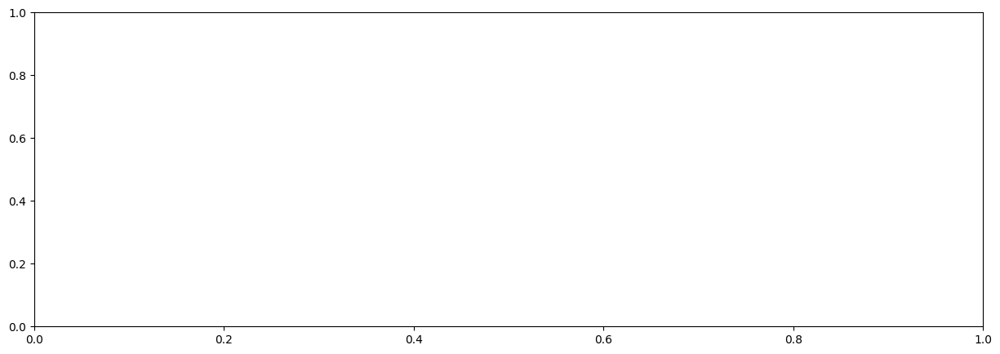

In [30]:
import matplotlib.pyplot as plt
%matplotlib inline
# Plotting a single channel
fig, ax = plt.subplots(figsize=[15, 5])

start_time = 15
end_time = 16
# Get the data from channel Pz, from 1500 - 1600 ms
data = raw.get_data(picks='EEG Pz',tmin=start_time, tmax=end_time).T
# Get the time values
times = np.linspace(start_time, end_time, num=data.shape[0])

ax.plot(times, data)
ax.set_title('EEG Signal at Pz')
ax.set_xlabel('Time (s)')
ax.set_ylabel('Amplitude (μV)')
plt.show()

In [ ]:
plot_eeg_multiple_new_new(results_for_analysis["SE021_a1"]["data_testing_cropped_labeled"])

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x0000025AB630E480> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

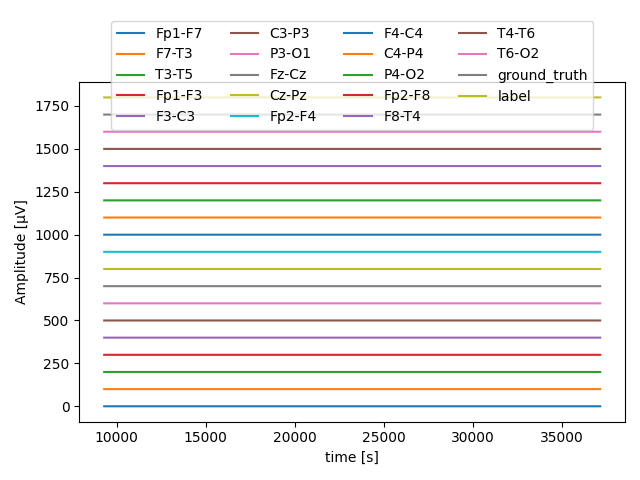

In [ ]:
plot_eeg(results_for_analysis["SE008_a1"]["data_testing_cropped_labeled"])

##### Plot LEARNED labels SE021_a1

In [ ]:
data_learning_SE021_a1 = patient_data['SE021_a1']['testing_data']
eeg_learning_SE021_a1 = detector.get_windows(patient_data['SE021_a1']['eeg_training'])
learned_labels21 = detector_results.loc[detector_results['patient_id'] == 'SE021_a1', 'labels'].values[0]

labels_frame = combine_windows_with_labels(eeg_learning_SE021_a1, learned_labels21)
data_learning_labeled21 = data_learning_SE021_a1.copy()
data_learning_labeled21['label'] = labels_frame['label']

TypeError: Index(...) must be called with a collection of some kind, <built-in method index of str object at 0x0000025AD2E80DF0> was passed

In [ ]:
plot_eeg(data_learning_labeled21)

##### Plot LEARNED labels SE026_a1

In [ ]:
data_learning_SE026_a1 = patient_data['SE026_a1']['testing_data']
eeg_learning_SE026_a1 = detector.get_windows(patient_data['SE026_a1']['eeg_training'])
learned_labels26 = detector_results.loc[detector_results['patient_id'] == 'SE026_a1', 'labels'].values[0]

labels_frame = combine_windows_with_labels(eeg_learning_SE026_a1, learned_labels26)
data_learning_labeled26 = data_learning_SE026_a1.copy()
data_learning_labeled26['label'] = labels_frame['label']

In [ ]:
plot_eeg(data_learning_SE026_a1)

In [ ]:
plot_eeg(patient_data['SE026_a1']['eeg_learning'])

In [ ]:
plot_eeg(data_learning_labeled26)

##### Plot PREDICTED Labels SE021_a1

In [ ]:
data_testing_SE021_a1 = patient_data['SE021_a1']['data_testing']
eeg_testing_SE021_a1 = detector.get_windows(patient_data['SE021_a1']['eeg_testing'])
predicted_labels21 = detector_results.loc[detector_results['patient_id'] == 'SE021_a1', 'predictions'].values[0]

labels_frame = combine_windows_with_labels(eeg_testing_SE021_a1, predicted_labels21)
data_testing_labeled21 = data_testing_SE021_a1.copy()
data_testing_labeled21['label'] = labels_frame['label']

KeyError: 'data_testing'

In [ ]:
print(predicted_labels21.shape)

In [ ]:
plot_eeg(data_testing_labeled21)

##### Plot PREDICTED Labels SE026_a1

In [ ]:
data_testing_SE026_a1 = patient_data['SE026_a1']['data_testing']
eeg_testing_SE026_a1 = detector.get_windows(patient_data['SE026_a1']['eeg_testing'])
predicted_labels26 = detector_results.loc[detector_results['patient_id'] == 'Pat19', 'predictions'].values[0]

labels_frame = combine_windows_with_labels(eeg_testing_SE026_a1, predicted_labels26)
data_testing_labeled26 = data_testing_SE026_a1.copy()
data_testing_labeled26['label'] = labels_frame['label']

In [ ]:
print(predicted_labels26)

In [ ]:
plot_eeg(data_testing_labeled26)

#### Confusion matrix: 
Obtatining the confusion matrix to evaluate the performance of the detector.

Confusion matrix for patient SE008_a1:
Confusion matrix for patient SE021_a1:
Confusion matrix for patient SE026_a1:
Confusion matrix for patient SE038_a1:


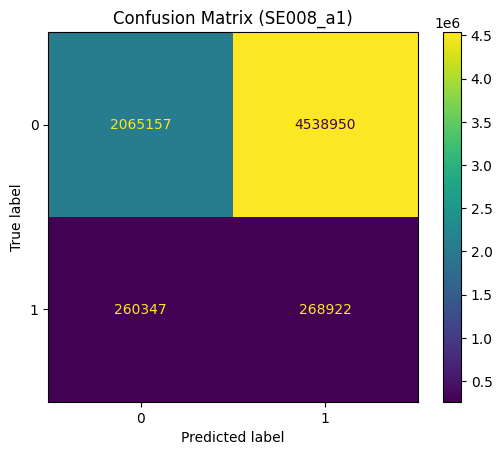

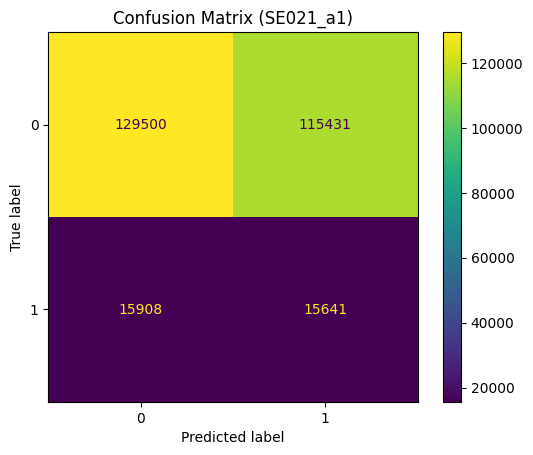

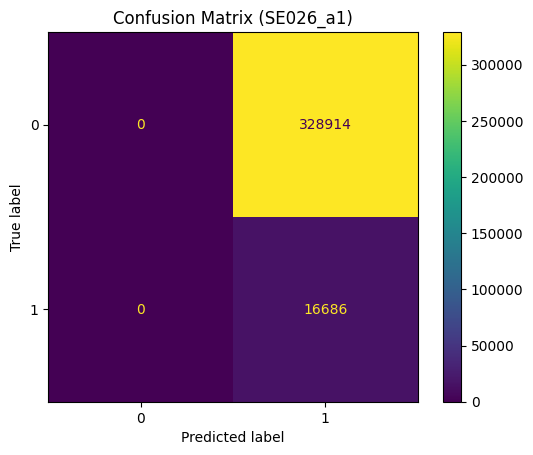

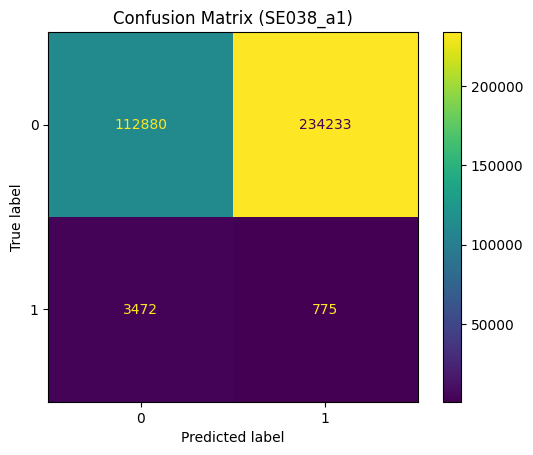

In [33]:
from sklearn.metrics import ConfusionMatrixDisplay
import numpy as np

for patient_id, patient_info in results_for_analysis.items():
    data_testing_cropped_labeled = patient_info['data_testing_cropped_labeled']
    labels_true = data_testing_cropped_labeled['ground_truth']
    labels_predicted = data_testing_cropped_labeled['label']

    # Check if the arrays have the same length
    if len(labels_true) != len(labels_predicted):
        print(f"Error: Arrays have different lengths for patient {patient_id}")
        continue

    # Compute the confusion matrix
    cf = ConfusionMatrixDisplay.from_predictions(labels_true, labels_predicted,
                                                 values_format='d',
                                                 cmap='viridis'
                                                 )

    # Round the outputs within the matrix
    cf.ax_.set_title(f"Confusion Matrix ({patient_id})")

    # Print the confusion matrix
    print(f"Confusion matrix for patient {patient_id}:")
    print(cf)

In [34]:
from sklearn.metrics import confusion_matrix

for patient_id, patient_info in results_for_analysis.items():
    data_testing_cropped_labeled = patient_info['data_testing_cropped_labeled']
    labels_true = data_testing_cropped_labeled['ground_truth']
    labels_predicted = data_testing_cropped_labeled['label']

    # Compute the confusion matrix
    cm = confusion_matrix(labels_true, labels_predicted)

    # Print the confusion matrix
    print(f"Confusion matrix for patient {patient_id}:")
    print(cm)

Confusion matrix for patient SE008_a1:
[[2065157 4538950]
 [ 260347  268922]]
Confusion matrix for patient SE021_a1:
[[129500 115431]
 [ 15908  15641]]
Confusion matrix for patient SE026_a1:
[[     0 328914]
 [     0  16686]]
Confusion matrix for patient SE038_a1:
[[112880 234233]
 [  3472    775]]


#### Save 'detector results' in data folder

In [41]:
results_for_analysis.keys()

dict_keys(['SE008_a1', 'SE021_a1', 'SE026_a1', 'SE038_a1'])

In [37]:
results_for_analysis

{'SE008_a1': {'predictions': array([1, 1, 1, ..., 0, 1, 1]),
  'labels': array([1, 0, 1, ..., 1, 1, 1]),
  'cov_matrices': [array([[ 2.69927009e+01,  7.62134567e+00,  7.54158654e+00,
            2.00197489e+01, -3.53026381e-01, -4.52426536e-02,
            6.94754103e+00, -2.74543065e-01,  1.26580214e+01,
            1.09117788e+01,  2.09320753e+01,  2.62730956e+00,
            2.60320207e-01,  3.09180587e-02, -4.17902040e-02,
            6.63868711e+00,  6.66678356e-01],
          [ 7.62134567e+00,  2.92412077e+01,  1.90870903e+01,
            1.90642700e+01,  9.18343946e-02, -4.09255730e-01,
            2.56392973e+00, -2.47804986e-01,  2.46184198e+01,
            7.00356805e+00,  3.42113054e+01,  1.10630970e+00,
            2.62738362e-01,  1.41697646e-01,  2.14800884e-01,
            4.75947432e+00,  5.97004803e-01],
          [ 7.54158654e+00,  1.90870903e+01,  7.25910282e+01,
            7.78053314e+00, -1.82654605e-01, -3.71075566e-01,
            8.22196480e+00, -4.39918427e-01

In [50]:
def save_results_to_hdf5(results_dict, output_folder):
    """
    Saves EEG burst suppression detection results to individual HDF5 files for each patient,
    with a progress bar for visualization.

    Args:
        results_dict (dict): A dictionary where keys are patient IDs and values are 
                             dictionaries containing results (predictions, labels, etc.).
        output_folder (str): The path to the folder where HDF5 files will be saved.
    """

    os.makedirs(output_folder, exist_ok=True)

    for patient_id in tqdm.tqdm(results_dict, desc="Saving patient data"):
        results = results_dict[patient_id]
        filename = f"{patient_id}_results.hdf5"
        filepath = os.path.join(output_folder, filename)
        with h5py.File(filepath, 'w') as hf:
            for key, value in results.items():
                try:
                    hf.create_dataset(key, data=value)
                except TypeError as e:
                    print(f"Warning: Could not save '{key}' for {patient_id} due to TypeError: {e}")

In [51]:
OUTPUT_FOLDER = OUTPUT_FOLDER
save_results_to_hdf5(results_for_analysis, OUTPUT_FOLDER)

Saving patient data: 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]


In [55]:
results_for_analysis_df = pd.DataFrame(results_for_analysis).T
results_for_analysis_df['patient_id'] = results_for_analysis_df.index
results_for_analysis_df.reset_index(drop=True, inplace=True)
results_for_analysis_df = results_for_analysis_df[['patient_id'] + [col for col in results_for_analysis_df.columns if col != 'patient_id']]
print(results_for_analysis_df)

  patient_id                                        predictions  \
0   SE008_a1  [1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, ...   
1   SE021_a1  [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, ...   
2   SE026_a1  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
3   SE038_a1  [0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, ...   

                                              labels  \
0  [1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, ...   
1  [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, ...   
2  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
3  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...   

                                        cov_matrices  \
0  [[[26.992700922233784, 7.6213456744001515, 7.5...   
1  [[[229.05155250173624, 66.79825945337608, 0.62...   
2  [[[0.9936318164985638, -0.003569417020953779, ...   
3  [[[1.0645956505413194, -0.00286503363865887, 0...   

                                            metric_d  \
0  [[3.732067169519926e-15, 10.269882407186106

#### Calculate Specificity and Sensitivity with Numpy

In [58]:
for patient_id, patient_info in results_for_analysis.items():
    data_testing_cropped_labeled = patient_info['data_testing_cropped_labeled']
    labels_true = data_testing_cropped_labeled['ground_truth']
    labels_predicted = data_testing_cropped_labeled['label']

    confusion_matrix = confusion_matrix(labels_true, labels_predicted)

    TN = confusion_matrix[0, 0]
    FP = confusion_matrix[0, 1]
    FN = confusion_matrix[1, 0]
    TP = confusion_matrix[1, 1]

    sensitivity = TP / (TP + FN)
    specificity = TN / (TN + FP)

    recall = sensitivity
    precision = TP / (TP + FP)

    print(patient_id)
    print(confusion_matrix)

    print(f"TP: Correctly predicted bursts ({TP})")
    print(f"FP: Incorrectly predicted bursts ({FP})")
    print(f"FN: Incorrectly predicted no-bursts ({FN})")
    print(f"TN: Correctly predicted no-bursts ({TN})")

    print(f"Sensitivity/Recall: {sensitivity:.2f}")
    print(f"Specificity: {specificity:.2f}")

    print(f"Precision: {precision:.2f}")

TypeError: 'numpy.ndarray' object is not callable

#### Calculate AUROC 

get the ground truth labels from `testing_data['ground_truth']`

In [ ]:
''''
from sklearn.metrics import auc, roc_curve

fpr, tpr, _ = roc_curve(true_labels, predicted_scores)
auroc = auc(fpr, tpr)
print(f"AUROC: {auroc:.2f}")
'''

In [52]:
from sklearn.metrics import roc_auc_score

auroc_scores = {}

for patient_id, patient_info in results_for_analysis.items():
    data_testing_cropped_labeled = patient_info['data_testing_cropped_labeled']
    labels_true = data_testing_cropped_labeled['ground_truth']
    labels_predicted = data_testing_cropped_labeled['label']

    try:
        auroc = roc_auc_score(labels_true, labels_predicted) 
    except ValueError as e:
        if "Only one class present in y_true" in str(e):
            print(f"Only one class present in y_true. ROC AUC score is not defined in that case.")
            print(f"Warning: Skipping ROC AUC calculation for Patient {patient_id}")
            continue
        else:
            raise  # Re-raise the exception if it's not the specific ValueError we're handling

    auroc_scores[patient_id] = round(auroc, 2) 

In [53]:
print(auroc_scores)

{'SE008_a1': 0.41, 'SE021_a1': 0.51, 'SE026_a1': 0.5, 'SE038_a1': 0.25}


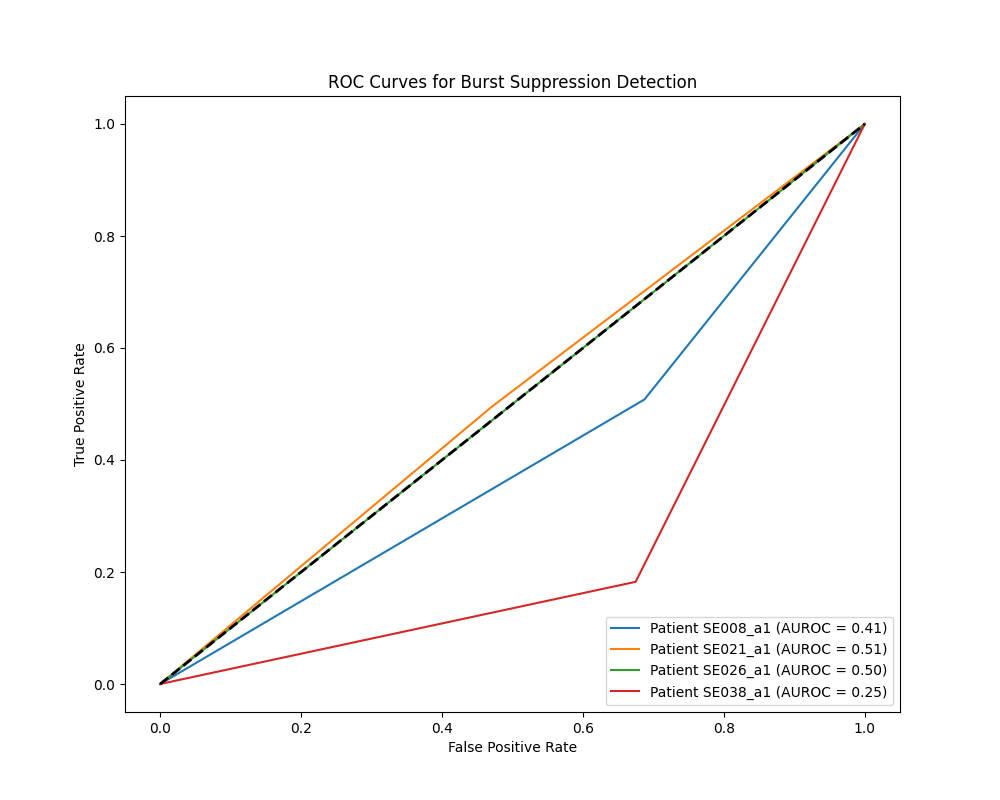

In [54]:
from sklearn.metrics import roc_curve, auc
from sklearn.exceptions import UndefinedMetricWarning
import warnings

plt.figure(figsize=(10, 8))

for patient_id, patient_info in results_for_analysis.items():
    data_testing_cropped_labeled = patient_info['data_testing_cropped_labeled']
    labels_true = data_testing_cropped_labeled['ground_truth']
    labels_predicted = data_testing_cropped_labeled['label']

    try:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=UndefinedMetricWarning)
            fpr, tpr, thresholds = roc_curve(labels_true, labels_predicted)
            auroc = auc(fpr, tpr) 
            
        plt.plot(fpr, tpr, label=f'Patient {patient_id} (AUROC = {auroc:.2f})')

    except ValueError as e:
        if "Only one class present in y_true" in str(e):
            print(f"Only one class present in y_true for Patient {patient_id}. ROC AUC score is not defined.")
            # You can choose to plot a default curve or skip plotting for this patient
            # plt.plot([0, 1], [0, 1], 'k--', label=f'Patient {patient_id} (AUROC = N/A)') 
            continue
        else:
            raise  

plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Diagonal dashed line for reference
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Burst Suppression Detection')
plt.legend(loc="lower right")
plt.show()

#### TO DO: Calculate Burst Per Minute (BPM)

In [ ]:
# Calculate Bursts Per Minute (BPM)
def calculate_bpm(data, bursts_column, window_size_seconds=2, sample_rate=256):
    total_eeg_duration = (len(data) / sample_rate / 60)
    bursts = []
    in_burst = False
    window_start_time = None

    for i, row in data.iterrows():
        if row[bursts_column] == 1 and not in_burst:
            # Start of a new burst
            in_burst = True
            window_start_time = i 
            bursts.append(i)
        elif row[bursts_column] == 0 and in_burst:
            # End of a burst
            in_burst = False
        elif in_burst and (i - window_start_time).total_seconds() >= window_size_seconds:
            # Still in a burst, but outside the current window
            in_burst = False

    total_bursts = len(bursts)

    bpm = total_bursts / total_eeg_duration
    return bpm

Calculate the true rate of BPM using the ground truth

In [ ]:
#NEED TO LOOP THIS FOR ALL PATients
ground_truth_bpm = calculate_bpm(data_testing_labeled, 'ground_truth')
print(f"Ground Truth BPM: {ground_truth_bpm:.2f}")

Calculate the predicted BPM rate based on the predicted labels

In [ ]:
#NEED TO LOOP THIS FOR ALL PATients
predicted_bpm = calculate_bpm(data_testing_labeled, 'label')
print(f"Predicted BPM: {predicted_bpm:.2f}")

##### Calculate Mean Absolute Error (MAE) of BPM

$MAE_{BPM} = \text{mean}(|BPM_{groundtruth} - BPM_{predicted}|)$

In [ ]:
#NEED TO LOOP THIS FOR ALL PATients
# mean absolute error (MAE) of BPM (mean(|ground truth BPM – estimated BPM|))
MAE = np.mean(np.absolute(ground_truth_bpm - predicted_bpm))
print(f"Mean Absolute Error (BPM): {MAE:.2f}")

### TO DO: Classification Report

Very Low Precision for Bursts: The precision for the "burst" class (1.0) is extremely low (0.06). This suggests that when the algorithm predicts a burst, it's very often incorrect. This aligns with the high number of false positives (115,517) compared to true positives (83).


In [ ]:
from sklearn.metrics import classification_report
#NEED TO LOOP THIS FOR ALL PATients
cr = classification_report(true_labels, predicted_scores)
print(cr)